### Loading and preparation of data.

Import modules.

In [1]:
import re
import nltk
import string
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from langdetect import detect
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.stem.wordnet import WordNetLemmatizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix 

Load dataset.

In [2]:
news = ""                                                               #Load the News dataset
with open("./Data/News/News Set B.txt","r", encoding='utf-8') as f:
    news = " ".join([l.strip() for l in f.readlines()])

In [3]:
news[0:200]          #First 200 characters

'URL: http://www.nytimes.com/2016/06/30/sports/baseball/washington-nationals-max-scherzer-baffles-mets-completing-a-sweep.html  WASHINGTON — Stellar pitching kept the Mets afloat in the first half of l'

In [4]:
len(news)            #Total characters

44041116

Retrieving URL and News Category.

In [5]:
news_url = re.compile("URL:\shttp://www.nytimes.com/(?:[a-zA-Z]|[0-9]|[$-_@.&+])+")
url = news_url.findall(news)            #Retrieving all URL links of News Dataset
url

['URL: http://www.nytimes.com/2016/06/30/sports/baseball/washington-nationals-max-scherzer-baffles-mets-completing-a-sweep.html',
 'URL: http://www.nytimes.com/2016/06/30/nyregion/mayor-de-blasios-counsel-to-leave-next-month-to-lead-police-review-board.html',
 'URL: http://www.nytimes.com/2016/06/30/nyregion/three-men-charged-in-killing-of-cuomo-administration-lawyer.html',
 'URL: http://www.nytimes.com/2016/06/30/nyregion/tekserve-precursor-to-the-apple-store-to-close-after-29-years.html',
 'URL: http://www.nytimes.com/2016/06/30/sports/olympics/once-at-michael-phelpss-feet-and-still-chasing-them.html',
 'URL: http://www.nytimes.com/2016/06/30/sports/olympics/missy-franklin-breaks-through-in-trials-and-earns-a-return-to-olympics.html',
 'URL: http://www.nytimes.com/2016/06/30/business/dealbook/lionsgate-is-said-to-be-near-deal-to-buy-starz.html',
 'URL: http://www.nytimes.com/2016/06/30/nyregion/pool-rules-no-running-no-eating-or-drinking-no-men.html',
 'URL: http://www.nytimes.com/20

In [6]:
len(url)              #Total number of Articles

8888

In [7]:
label = [lab.split("/")[6:7] for lab in url]           #Category is in between 6th and 7th /
label = [brak for lab in label for brak in lab]        #Return single list
label

['sports',
 'nyregion',
 'nyregion',
 'nyregion',
 'sports',
 'sports',
 'business',
 'nyregion',
 'sports',
 'nyregion',
 'world',
 'us',
 'nyregion',
 'world',
 'technology',
 'us',
 'world',
 'nyregion',
 'us',
 'sports',
 'us',
 'world',
 'fashion',
 'sports',
 'sports',
 'arts',
 'world',
 'us',
 'world',
 'fashion',
 'us',
 'sports',
 'fashion',
 'world',
 'science',
 'arts',
 'style',
 'fashion',
 'arts',
 'world',
 'world',
 'theater',
 'business',
 'fashion',
 'business',
 'business',
 'us',
 'world',
 'technology',
 'arts',
 'world',
 'business',
 'theater',
 'nyregion',
 'world',
 'sports',
 'technology',
 'your-money',
 'science',
 'fashion',
 'us',
 'world',
 'theater',
 'business',
 'business',
 'arts',
 'arts',
 'world',
 'fashion',
 'sports',
 'us',
 'business',
 'technology',
 'world',
 'technology',
 'business',
 'books',
 'us',
 'sports',
 'us',
 'technology',
 'business',
 'us',
 'sports',
 'business',
 'world',
 'us',
 'business',
 'world',
 'business',
 'technolog

In [8]:
spt_news = news_url.split(news)          #Split individual Articles by its URL
print(spt_news[0:2])                     #First index is blank, have to drop

['', '  WASHINGTON — Stellar pitching kept the Mets afloat in the first half of last season despite their offensive woes. But they cannot produce an encore of their pennant-winning season if their lineup keeps floundering while their pitching is nicked, bruised and stretched thin. “We were going to ride our pitching,” Manager Terry Collins said before Wednesday’s game. “But we’re not riding it right now. We’ve got as many problems with our pitching as we do anything.” Wednesday’s 4-2 loss to the Washington Nationals was cruel for the already-limping Mets. Pitching in Steven Matz’s place, the spot starter Logan Verrett allowed two runs over five innings. But even that was too large a deficit for the Mets’ lineup to overcome against Max Scherzer, the Nationals’ starter. “We’re not even giving ourselves chances,” Collins said, adding later, “We just can’t give our pitchers any room to work.” The Mets did not score until the ninth inning, when a last-gasp two-run homer by James Loney off N

Arranging the articles into a dataframe.

In [9]:
df = pd.DataFrame(spt_news, columns= ["News_Articles"])     #Dataframe the articles and with its catergory
df.drop(df.index[0], inplace=True)                          #Remove blank index
df["labels"] = label
df

,News_Articles,labels
1,WASHINGTON — Stellar pitching kept the Mets ...,sports
2,Mayor Bill de Blasio’s counsel and chief leg...,nyregion
3,In the early morning hours of Labor Day last...,nyregion
4,It was the Apple Store in New York City befo...,nyregion
5,OMAHA — The United States Olympic swimming t...,sports
...,...,...
8884,There is a second critical contest in Americ...,us
8885,"On April 1, police officers from the 108th P...",nyregion
8886,"KHILAD, India — The cattle camp, on a dusty ...",world
8887,The director J.J. Abrams dropped a possible ...,movies


In [10]:
df.info()           #Information of the dataframe

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8888 entries, 1 to 8888
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   News_Articles  8888 non-null   object
 1   labels         8888 non-null   object
dtypes: object(2)
memory usage: 208.3+ KB


In [11]:
df.labels.value_counts()        #Total count of individual categories


sports         1268
world          1211
us             1199
business       1041
nyregion        663
arts            663
fashion         619
technology      232
dining          210
t-magazine      198
realestate      166
science         162
magazine        156
theater         145
travel          142
upshot          130
movies          126
insider          94
books            85
health           78
nytnow           70
pageoneplus      70
your-money       60
style            32
education        27
jobs             17
automobiles      16
universal         8
Name: labels, dtype: int64

In [12]:
print(df.head())
print(df.tail())

                                       News_Articles    labels
1    WASHINGTON — Stellar pitching kept the Mets ...    sports
2    Mayor Bill de Blasio’s counsel and chief leg...  nyregion
3    In the early morning hours of Labor Day last...  nyregion
4    It was the Apple Store in New York City befo...  nyregion
5    OMAHA — The United States Olympic swimming t...    sports
                                          News_Articles    labels
8884    There is a second critical contest in Americ...        us
8885    On April 1, police officers from the 108th P...  nyregion
8886    KHILAD, India — The cattle camp, on a dusty ...     world
8887    The director J.J. Abrams dropped a possible ...    movies
8888    PALOS VERDES ESTATES, Calif. — From high ato...        us


### Data Cleaning and Preprocessing

Remove capital letters.

In [13]:
df.News_Articles = df.News_Articles.apply(lambda words: words.lower())     #All characters in news articles to be lowercase
df

,News_Articles,labels
1,washington — stellar pitching kept the mets ...,sports
2,mayor bill de blasio’s counsel and chief leg...,nyregion
3,in the early morning hours of labor day last...,nyregion
4,it was the apple store in new york city befo...,nyregion
5,omaha — the united states olympic swimming t...,sports
...,...,...
8884,there is a second critical contest in americ...,us
8885,"on april 1, police officers from the 108th p...",nyregion
8886,"khilad, india — the cattle camp, on a dusty ...",world
8887,the director j.j. abrams dropped a possible ...,movies


Remove punctuation.

In [14]:
def punc(words):     #Remove punctuation from news articles 
    punct = "".join([w for w in words if not w in string.punctuation])
    return punct                                                           

df.News_Articles = df.News_Articles.apply(lambda x: punc(x))
df

,News_Articles,labels
1,washington — stellar pitching kept the mets ...,sports
2,mayor bill de blasio’s counsel and chief leg...,nyregion
3,in the early morning hours of labor day last...,nyregion
4,it was the apple store in new york city befo...,nyregion
5,omaha — the united states olympic swimming t...,sports
...,...,...
8884,there is a second critical contest in americ...,us
8885,on april 1 police officers from the 108th pr...,nyregion
8886,khilad india — the cattle camp on a dusty ba...,world
8887,the director jj abrams dropped a possible hi...,movies


Remove numbers.

In [15]:
no_num = lambda x: re.sub(r"\w*\d\w*", "", x)         #Remove digits from news articles
df.News_Articles = df.News_Articles.map(no_num)
df

,News_Articles,labels
1,washington — stellar pitching kept the mets ...,sports
2,mayor bill de blasio’s counsel and chief leg...,nyregion
3,in the early morning hours of labor day last...,nyregion
4,it was the apple store in new york city befo...,nyregion
5,omaha — the united states olympic swimming t...,sports
...,...,...
8884,there is a second critical contest in americ...,us
8885,on april police officers from the precinct...,nyregion
8886,khilad india — the cattle camp on a dusty ba...,world
8887,the director jj abrams dropped a possible hi...,movies


Tokenize by words.

In [16]:
df.News_Articles = df.News_Articles.map(word_tokenize)      #Tokenize the sentences in the news articles into words
df

,News_Articles,labels
1,"[washington, —, stellar, pitching, kept, the, ...",sports
2,"[mayor, bill, de, blasio, ’, s, counsel, and, ...",nyregion
3,"[in, the, early, morning, hours, of, labor, da...",nyregion
4,"[it, was, the, apple, store, in, new, york, ci...",nyregion
5,"[omaha, —, the, united, states, olympic, swimm...",sports
...,...,...
8884,"[there, is, a, second, critical, contest, in, ...",us
8885,"[on, april, police, officers, from, the, preci...",nyregion
8886,"[khilad, india, —, the, cattle, camp, on, a, d...",world
8887,"[the, director, jj, abrams, dropped, a, possib...",movies


Remove stopwords.

In [17]:
st_words = set(stopwords.words(["english", "spanish"]))          #List of stopwords in english
st_words

{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'ain',
 'al',
 'algo',
 'algunas',
 'algunos',
 'all',
 'am',
 'an',
 'and',
 'ante',
 'antes',
 'any',
 'are',
 'aren',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 'como',
 'con',
 'contra',
 'couldn',
 "couldn't",
 'cual',
 'cuando',
 'd',
 'de',
 'del',
 'desde',
 'did',
 'didn',
 "didn't",
 'do',
 'does',
 'doesn',
 "doesn't",
 'doing',
 'don',
 "don't",
 'donde',
 'down',
 'durante',
 'during',
 'e',
 'each',
 'el',
 'ella',
 'ellas',
 'ellos',
 'en',
 'entre',
 'era',
 'erais',
 'eran',
 'eras',
 'eres',
 'es',
 'esa',
 'esas',
 'ese',
 'eso',
 'esos',
 'esta',
 'estaba',
 'estabais',
 'estaban',
 'estabas',
 'estad',
 'estada',
 'estadas',
 'estado',
 'estados',
 'estamos',
 'estando',
 'estar',
 'estaremos',
 'estará',
 'estarán',
 'estarás',
 'estaré',
 'estaréis',
 'estaría',
 'estaríais',
 'estaríamos',
 'estarían',
 'estarías',
 'es

In [18]:
df.News_Articles = df.News_Articles.apply(lambda words: [w for w in words if w not in st_words])
df             #Removing stopwords from news articles

,News_Articles,labels
1,"[washington, —, stellar, pitching, kept, mets,...",sports
2,"[mayor, bill, blasio, ’, counsel, chief, legal...",nyregion
3,"[early, morning, hours, labor, day, last, year...",nyregion
4,"[apple, store, new, york, city, thing, apple, ...",nyregion
5,"[omaha, —, united, states, olympic, swimming, ...",sports
...,...,...
8884,"[second, critical, contest, america, ’, electi...",us
8885,"[april, police, officers, precinct, called, ad...",nyregion
8886,"[khilad, india, —, cattle, camp, dusty, back, ...",world
8887,"[director, jj, abrams, dropped, possible, hint...",movies


Normalization - Lemmatization

In [19]:
lemma = WordNetLemmatizer()    #Lemmatize the words
df.News_Articles = df.News_Articles.apply(lambda words: [lemma.lemmatize(w) for w in words])
df

,News_Articles,labels
1,"[washington, —, stellar, pitching, kept, mets,...",sports
2,"[mayor, bill, blasio, ’, counsel, chief, legal...",nyregion
3,"[early, morning, hour, labor, day, last, year,...",nyregion
4,"[apple, store, new, york, city, thing, apple, ...",nyregion
5,"[omaha, —, united, state, olympic, swimming, t...",sports
...,...,...
8884,"[second, critical, contest, america, ’, electi...",us
8885,"[april, police, officer, precinct, called, add...",nyregion
8886,"[khilad, india, —, cattle, camp, dusty, back, ...",world
8887,"[director, jj, abrams, dropped, possible, hint...",movies


In [20]:
df.to_csv("Articles_clean.csv")

### Feature Engineering and Topic Modelling

Document-term Matrixes.

In [20]:
df.News_Articles

1       [washington, —, stellar, pitching, kept, mets,...
2       [mayor, bill, blasio, ’, counsel, chief, legal...
3       [early, morning, hour, labor, day, last, year,...
4       [apple, store, new, york, city, thing, apple, ...
5       [omaha, —, united, state, olympic, swimming, t...
                              ...                        
8884    [second, critical, contest, america, ’, electi...
8885    [april, police, officer, precinct, called, add...
8886    [khilad, india, —, cattle, camp, dusty, back, ...
8887    [director, jj, abrams, dropped, possible, hint...
8888    [palos, verdes, estate, calif, —, high, atop, ...
Name: News_Articles, Length: 8888, dtype: object

In [21]:
df = df.astype("str")      #Turn into string data for vectorization 
df

,News_Articles,labels
1,"['washington', '—', 'stellar', 'pitching', 'ke...",sports
2,"['mayor', 'bill', 'blasio', '’', 'counsel', 'c...",nyregion
3,"['early', 'morning', 'hour', 'labor', 'day', '...",nyregion
4,"['apple', 'store', 'new', 'york', 'city', 'thi...",nyregion
5,"['omaha', '—', 'united', 'state', 'olympic', '...",sports
...,...,...
8884,"['second', 'critical', 'contest', 'america', '...",us
8885,"['april', 'police', 'officer', 'precinct', 'ca...",nyregion
8886,"['khilad', 'india', '—', 'cattle', 'camp', 'du...",world
8887,"['director', 'jj', 'abrams', 'dropped', 'possi...",movies


In [22]:
punc = lambda x: re.sub(r"""[\.\,"'\)\[\]\(\"\“\”\’\:\-]""", " ", x)    #Remove punctuation
df.News_Articles = df.News_Articles.map(punc)  
df

,News_Articles,labels
1,washington — stellar pitching ke...,sports
2,mayor bill blasio counsel c...,nyregion
3,early morning hour labor day ...,nyregion
4,apple store new york city thi...,nyregion
5,omaha — united state olympic ...,sports
...,...,...
8884,second critical contest america ...,us
8885,april police officer precinct ca...,nyregion
8886,khilad india — cattle camp du...,world
8887,director jj abrams dropped possi...,movies


In [23]:
doc = df.News_Articles       #Data for CountVectorizer
doc

1         washington    —    stellar    pitching    ke...
2         mayor    bill    blasio         counsel    c...
3         early    morning    hour    labor    day    ...
4         apple    store    new    york    city    thi...
5         omaha    —    united    state    olympic    ...
                              ...                        
8884      second    critical    contest    america    ...
8885      april    police    officer    precinct    ca...
8886      khilad    india    —    cattle    camp    du...
8887      director    jj    abrams    dropped    possi...
8888      palos    verdes    estate    calif    —    h...
Name: News_Articles, Length: 8888, dtype: object

Vectorize the document.

In [24]:
#max_df : ignore terms with document frequency strictly higher than the given threshold
#max_features : only consider the top max_features ordered by term frequency across the corpus
cv_doc = CountVectorizer(max_df=0.8, max_features=7500)                       
doc_term = cv_doc.fit_transform(doc)
doc_fea_nam = cv_doc.get_feature_names()

In [25]:
doc_fea_nam

['aaa',
 'aaron',
 'abandon',
 'abandoned',
 'abbott',
 'abc',
 'abe',
 'ability',
 'able',
 'aboard',
 'abortion',
 'abrams',
 'abroad',
 'abruptly',
 'absence',
 'absent',
 'absolute',
 'absolutely',
 'absorb',
 'abstract',
 'absurd',
 'abu',
 'abuse',
 'abused',
 'academic',
 'academy',
 'accent',
 'accept',
 'acceptable',
 'acceptance',
 'accepted',
 'accepting',
 'access',
 'accessible',
 'accessory',
 'accident',
 'accidentally',
 'accommodate',
 'accommodation',
 'accompanied',
 'accompanying',
 'accomplish',
 'accomplished',
 'accomplishment',
 'accord',
 'according',
 'account',
 'accountability',
 'accountable',
 'accountant',
 'accounted',
 'accounting',
 'accurate',
 'accusation',
 'accused',
 'accusing',
 'accustomed',
 'ace',
 'achieve',
 'achieved',
 'achievement',
 'acknowledge',
 'acknowledged',
 'acknowledging',
 'acquire',
 'acquired',
 'acquiring',
 'acquisition',
 'acquitted',
 'acre',
 'across',
 'act',
 'acted',
 'acting',
 'action',
 'active',
 'actively',
 'act

In [26]:
print(doc_term)

  (0, 7295)	2
  (0, 4964)	6
  (0, 3665)	2
  (0, 4207)	13
  (0, 2624)	2
  (0, 3027)	2
  (0, 3752)	1
  (0, 5934)	6
  (0, 1882)	1
  (0, 4583)	1
  (0, 7408)	1
  (0, 5194)	1
  (0, 3895)	4
  (0, 3653)	2
  (0, 6469)	1
  (0, 6784)	1
  (0, 2904)	3
  (0, 5720)	1
  (0, 4051)	2
  (0, 6753)	1
  (0, 1302)	8
  (0, 5840)	9
  (0, 7323)	3
  (0, 2821)	5
  (0, 5724)	1
  :	:
  (8887, 7441)	1
  (8887, 7348)	1
  (8887, 6087)	1
  (8887, 2837)	1
  (8887, 5052)	1
  (8887, 1238)	2
  (8887, 2631)	1
  (8887, 4576)	4
  (8887, 5389)	1
  (8887, 4976)	1
  (8887, 5376)	1
  (8887, 5047)	1
  (8887, 3776)	1
  (8887, 6034)	1
  (8887, 4849)	2
  (8887, 1046)	1
  (8887, 1218)	1
  (8887, 7469)	1
  (8887, 7062)	1
  (8887, 2310)	1
  (8887, 5711)	1
  (8887, 3796)	1
  (8887, 3091)	1
  (8887, 3023)	1
  (8887, 4221)	3


Choose LDA parameters.

In [27]:
topic_mod = []                 #Create list to append score

for i in range(20, 28):        #Loop through to find best number of components
    print("Applying and scoring LDA for Number of Topics={} ".format(i))
    lda = LatentDirichletAllocation(n_components = i, max_iter=5, learning_method='online', 
                                        learning_offset=50.,random_state=123) 
    
    topic_mod.append((i, lda, lda.fit_transform(doc_term), lda.score(doc_term),
                         lda.perplexity(doc_term)))   #Store results
    
for mod in topic_mod:
    print("Number of topics : {}, Log Likelihood : {:.2f}   Perplexity : {:.2f}".format(mod[0], mod[3], mod[4]))  

Applying and scoring LDA for Number of Topics=20 
Applying and scoring LDA for Number of Topics=21 
Applying and scoring LDA for Number of Topics=22 
Applying and scoring LDA for Number of Topics=23 
Applying and scoring LDA for Number of Topics=24 
Applying and scoring LDA for Number of Topics=25 
Applying and scoring LDA for Number of Topics=26 
Applying and scoring LDA for Number of Topics=27 
Number of topics : 20, Log Likelihood : -25545700.60   Perplexity : 1967.10
Number of topics : 21, Log Likelihood : -25564795.24   Perplexity : 1978.28
Number of topics : 22, Log Likelihood : -25571832.55   Perplexity : 1982.42
Number of topics : 23, Log Likelihood : -25551961.21   Perplexity : 1970.76
Number of topics : 24, Log Likelihood : -25576094.89   Perplexity : 1984.93
Number of topics : 25, Log Likelihood : -25544869.68   Perplexity : 1966.61
Number of topics : 26, Log Likelihood : -25519122.69   Perplexity : 1951.64
Number of topics : 27, Log Likelihood : -25525183.26   Perplexity : 

Create LDA model.

In [28]:
#Choose best parameter for n_components = 26
lda_mod = LatentDirichletAllocation(n_components= 26, max_iter=5, learning_method="online", learning_offset=50.,random_state=123)
lda_output = lda_mod.fit_transform(doc_term)   #Initiate and fit the model

print(lda_mod)  

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
                          evaluate_every=-1, learning_decay=0.7,
                          learning_method='online', learning_offset=50.0,
                          max_doc_update_iter=100, max_iter=5,
                          mean_change_tol=0.001, n_components=26, n_jobs=None,
                          perp_tol=0.1, random_state=123, topic_word_prior=None,
                          total_samples=1000000.0, verbose=0)


Classifying dominant topics to documents.

In [29]:
sub = ["Subject " + str(i) for i in range(lda_mod.n_components)]     #Column name   
doc = ["Doc" + str(i) for i in range(len(df))]                       #Index name

doc_topic = pd.DataFrame(np.round(lda_output, 2), columns=sub, index=doc)  #Create Dataframe

In [30]:
#Create dominant subject for each topic
doc_topic["Dominant_Subject"] = np.argmax(doc_topic.values, axis=1)
doc_topic

,Subject 0,Subject 1,Subject 2,Subject 3,Subject 4,Subject 5,Subject 6,Subject 7,Subject 8,Subject 9,...,Subject 17,Subject 18,Subject 19,Subject 20,Subject 21,Subject 22,Subject 23,Subject 24,Subject 25,Dominant_Subject
Doc0,0.00,0.00,0.00,0.00,0.00,0.08,0.00,0.00,0.00,0.00,...,0.00,0.92,0.00,0.00,0.0,0.00,0.00,0.00,0.00,18
Doc1,0.00,0.23,0.00,0.00,0.59,0.00,0.00,0.09,0.00,0.00,...,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.04,4
Doc2,0.00,0.00,0.01,0.00,0.65,0.00,0.00,0.00,0.00,0.08,...,0.04,0.00,0.04,0.00,0.0,0.03,0.00,0.15,0.00,4
Doc3,0.00,0.00,0.00,0.00,0.00,0.22,0.00,0.00,0.00,0.00,...,0.00,0.00,0.04,0.47,0.0,0.00,0.01,0.20,0.00,20
Doc4,0.00,0.00,0.00,0.00,0.01,0.10,0.00,0.00,0.00,0.00,...,0.00,0.00,0.03,0.00,0.0,0.00,0.02,0.00,0.00,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Doc8883,0.00,0.00,0.60,0.00,0.00,0.10,0.00,0.28,0.00,0.00,...,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,2
Doc8884,0.00,0.00,0.00,0.00,0.57,0.23,0.00,0.00,0.00,0.00,...,0.06,0.00,0.00,0.00,0.0,0.00,0.00,0.13,0.00,4
Doc8885,0.00,0.11,0.00,0.07,0.00,0.00,0.01,0.00,0.00,0.00,...,0.24,0.01,0.00,0.00,0.0,0.00,0.00,0.00,0.00,13
Doc8886,0.02,0.00,0.00,0.00,0.18,0.37,0.00,0.00,0.03,0.00,...,0.00,0.00,0.14,0.00,0.0,0.00,0.00,0.00,0.17,5


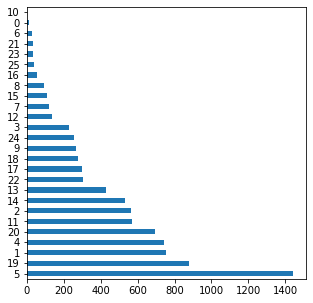

In [31]:
doc_topic["Dominant_Subject"].value_counts().plot(kind="barh", figsize=(5,5))     #Values count of Subject

See topic keywords.

In [32]:
#Topic-Keyword Matrix
topic_keywords = pd.DataFrame(np.round(lda_mod.components_, 2) , columns=doc_fea_nam, index=sub)
topic_keywords.head(23).T


,Subject 0,Subject 1,Subject 2,Subject 3,Subject 4,Subject 5,Subject 6,Subject 7,Subject 8,Subject 9,...,Subject 13,Subject 14,Subject 15,Subject 16,Subject 17,Subject 18,Subject 19,Subject 20,Subject 21,Subject 22
aaa,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,...,1.96,0.04,13.73,0.04,0.04,69.32,0.04,0.04,0.04,0.04
aaron,0.04,12.11,0.04,0.04,8.78,26.42,0.04,0.13,27.68,0.04,...,8.22,0.04,0.04,0.04,0.04,78.52,0.04,0.04,3.08,5.93
abandon,0.04,12.65,10.06,18.02,0.05,18.00,0.04,0.04,0.04,12.35,...,2.97,6.48,0.04,0.04,0.04,0.04,0.04,5.97,0.04,0.04
abandoned,0.04,21.78,0.04,0.04,1.39,16.06,0.04,0.04,0.04,17.35,...,14.32,11.19,0.04,0.04,63.27,4.31,28.38,23.93,17.80,0.34
abbott,0.04,0.05,0.04,7.03,0.04,0.04,0.04,0.14,0.04,0.04,...,0.20,0.06,0.04,0.04,0.04,0.04,0.04,52.86,0.04,0.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zoning,0.04,2.21,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,...,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.15
zoo,0.04,0.04,0.04,0.04,0.04,5.09,0.04,0.04,0.04,0.04,...,2.83,0.05,0.04,0.04,154.45,0.04,0.06,0.04,0.04,0.04
zuckerberg,0.04,0.53,6.72,0.04,4.38,0.04,0.04,0.04,0.04,0.04,...,0.04,0.04,0.04,0.04,0.04,0.04,0.04,132.52,0.04,0.04
있는,60.85,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,...,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04,0.04


Get top 15 words for each subject.

In [33]:
display_keywords = []

def display_topics(vect, lda, n_words):                                 #Display top 15 keywords for each subject  
    for topic_wei in lda_mod.components_:                               #Weight in topic components
        top_keywords = (-topic_wei).argsort()[:n_words]                 #Get top 15 weighted words and append to list
        display_keywords.append(np.array(doc_fea_nam).take(top_keywords))
        
    return display_keywords

In [34]:
dis_keywords = pd.DataFrame(display_topics(vect=cv_doc, lda=lda_mod, n_words=15))     #Create Dataframe to display keywords
dis_keywords.columns = ["Word" + str(i) for i in range(dis_keywords.shape[1])]        #Reference for topics labels
dis_keywords.index = ["Subject " + str(i) for i in range(dis_keywords.shape[0])]
dis_keywords


,Word0,Word1,Word2,Word3,Word4,Word5,Word6,Word7,Word8,Word9,Word10,Word11,Word12,Word13,Word14
Subject 0,dr,hospital,medical,medicine,study,university,care,jewish,shakespeare,jew,research,physician,surgery,luke,infection
Subject 1,said,year,would,state,school,new,student,people,many,could,one,university,health,program,also
Subject 2,mr,trump,clinton,said,campaign,republican,state,party,would,president,obama,sander,candidate,voter,election
Subject 3,european,mr,union,party,britain,europe,country,political,vote,british,minister,said,government,would,leader
Subject 4,mr,said,police,case,officer,lawyer,court,investigation,year,judge,state,department,two,one,prosecutor
Subject 5,said,like,one,time,people,would,way,get,thing,even,know,think,year,say,could
Subject 6,bank,financial,fund,debt,money,loan,investment,investor,billion,credit,firm,capital,hedge,asset,mr
Subject 7,republican,bill,state,senate,house,democrat,would,said,congress,law,senator,gun,committee,israel,governor
Subject 8,show,theater,season,ali,play,musical,broadway,new,hamilton,production,actor,ticket,horse,award,producer
Subject 9,state,said,united,military,mr,american,islamic,war,attack,force,government,group,official,saudi,syria


Proceed to label the data.

In [83]:
df1 = pd.read_csv("Articles_clean.csv")     #Load preprocessed Dataset
df1

,Unnamed: 0,News_Articles,labels
0,1,"['washington', '—', 'stellar', 'pitching', 'ke...",sports
1,2,"['mayor', 'bill', 'blasio', '’', 'counsel', 'c...",nyregion
2,3,"['early', 'morning', 'hour', 'labor', 'day', '...",nyregion
3,4,"['apple', 'store', 'new', 'york', 'city', 'thi...",nyregion
4,5,"['omaha', '—', 'united', 'state', 'olympic', '...",sports
5,6,"['omaha', '—', 'first', 'three', 'race', 'thir...",sports
6,7,"['lionsgate', 'near', 'deal', 'buy', 'starz', ...",business
7,8,"['slatecolored', 'light', 'slanting', 'skyligh...",nyregion
8,9,"['winter', 'garden', 'fla', '—', 'jeff', 'horn...",sports
9,10,"['washington', 'height', 'rejoiced', 'wednesda...",nyregion


Insert dominant subject into preprocessed Dataframe.

In [85]:
doc_topic = pd.DataFrame(np.round(lda_output, 2), columns=sub, index=doc)  #Create Dataframe
df1["Dominant_Subject"] = np.argmax(doc_topic.values, axis=1)              #Insert dominant subject into df1 column
df1.drop(columns = ["Unnamed: 0"], inplace=True)
df1

,News_Articles,labels,Dominant_Subject
0,"['washington', '—', 'stellar', 'pitching', 'ke...",sports,18
1,"['mayor', 'bill', 'blasio', '’', 'counsel', 'c...",nyregion,4
2,"['early', 'morning', 'hour', 'labor', 'day', '...",nyregion,4
3,"['apple', 'store', 'new', 'york', 'city', 'thi...",nyregion,20
4,"['omaha', '—', 'united', 'state', 'olympic', '...",sports,13
5,"['omaha', '—', 'first', 'three', 'race', 'thir...",sports,5
6,"['lionsgate', 'near', 'deal', 'buy', 'starz', ...",business,20
7,"['slatecolored', 'light', 'slanting', 'skyligh...",nyregion,17
8,"['winter', 'garden', 'fla', '—', 'jeff', 'horn...",sports,11
9,"['washington', 'height', 'rejoiced', 'wednesda...",nyregion,2


In [86]:
pd.set_option("display.max_rows", None)
print(df1[df1["Dominant_Subject"]==21])      #Reference topic with original label

                                          News_Articles  labels  \
24    ['clairefontaine', 'france', '—', 'like', 'the...  sports   
349   ['superb', 'performance', 'eden', 'hazard', 'g...  sports   
729   ['england', 'striker', 'jamie', 'vardy', 'agre...  sports   
849   ['paris', '—', 'first', 'day', 'european', 'ch...  sports   
850   ['late', 'winning', 'goal', 'spot', 'knockout'...  sports   
965   ['group', 'play', 'euro', 'come', 'close', 'we...  upshot   
1005  ['poland', 'play', 'switzerland', 'round', 'bi...  sports   
1006  ['croatia', 'came', 'behind', 'beat', 'spain',...  sports   
1068  ['paris', '—', 'early', 'make', 'definitive', ...  sports   
1218  ['albania', 'preserved', 'hope', 'qualifying',...  sports   
1322  ['late', 'goal', 'birkir', 'saevarsson', 'hand...  sports   
1334  ['group', 'russian', 'soccer', 'fan', 'deporte...  sports   
1340  ['bordeaux', 'france', '—', 'poor', 'start', '...  sports   
1461  ['belfast', 'northern', 'ireland', '—', 'day',...  sport

Replace topic subject number as the subject.

In [87]:
#Relabel the original label as a topic under dominant subject
df1.loc[(df1.Dominant_Subject == 0), "Dominant_Subject"] = "Health"
df1.loc[(df1.Dominant_Subject == 1), "Dominant_Subject"] = "Education"
df1.loc[(df1.Dominant_Subject == 2), "Dominant_Subject"] = "US_Politics"
df1.loc[(df1.Dominant_Subject == 3), "Dominant_Subject"] = "World_Affairs"
df1.loc[(df1.Dominant_Subject == 4), "Dominant_Subject"] = "World_Legal"
df1.loc[(df1.Dominant_Subject == 5), "Dominant_Subject"] = "Others"
df1.loc[(df1.Dominant_Subject == 6), "Dominant_Subject"] = "Finance_Investment"
df1.loc[(df1.Dominant_Subject == 7), "Dominant_Subject"] = "US_Legal"
df1.loc[(df1.Dominant_Subject == 8), "Dominant_Subject"] = "Theatre"
df1.loc[(df1.Dominant_Subject == 9), "Dominant_Subject"] = "Military"
df1.loc[(df1.Dominant_Subject == 10), "Dominant_Subject"] = "Environment"
df1.loc[(df1.Dominant_Subject == 11), "Dominant_Subject"] = "Sports_Mixed"
df1.loc[(df1.Dominant_Subject == 12), "Dominant_Subject"] = "Legal"
df1.loc[(df1.Dominant_Subject == 13), "Dominant_Subject"] = "Dining"
df1.loc[(df1.Dominant_Subject == 14), "Dominant_Subject"] = "World_Politics"
df1.loc[(df1.Dominant_Subject == 15), "Dominant_Subject"] = "Finance"
df1.loc[(df1.Dominant_Subject == 16), "Dominant_Subject"] = "Sports_Olympics"
df1.loc[(df1.Dominant_Subject == 17), "Dominant_Subject"] = "Science_Nature"
df1.loc[(df1.Dominant_Subject == 18), "Dominant_Subject"] = "Sports_Others"
df1.loc[(df1.Dominant_Subject == 19), "Dominant_Subject"] = "Arts"
df1.loc[(df1.Dominant_Subject == 20), "Dominant_Subject"] = "Business_Technology"
df1.loc[(df1.Dominant_Subject == 21), "Dominant_Subject"] = "Sports_Soccer"
df1.loc[(df1.Dominant_Subject == 22), "Dominant_Subject"] = "Fashion"
df1.loc[(df1.Dominant_Subject == 23), "Dominant_Subject"] = "World_Asia"
df1.loc[(df1.Dominant_Subject == 24), "Dominant_Subject"] = "Real_Estate"
df1.loc[(df1.Dominant_Subject == 25), "Dominant_Subject"] = "Business"


In [88]:
df1

,News_Articles,labels,Dominant_Subject
0,"['washington', '—', 'stellar', 'pitching', 'ke...",sports,Sports_Others
1,"['mayor', 'bill', 'blasio', '’', 'counsel', 'c...",nyregion,World_Legal
2,"['early', 'morning', 'hour', 'labor', 'day', '...",nyregion,World_Legal
3,"['apple', 'store', 'new', 'york', 'city', 'thi...",nyregion,Business_Technology
4,"['omaha', '—', 'united', 'state', 'olympic', '...",sports,Dining
5,"['omaha', '—', 'first', 'three', 'race', 'thir...",sports,Others
6,"['lionsgate', 'near', 'deal', 'buy', 'starz', ...",business,Business_Technology
7,"['slatecolored', 'light', 'slanting', 'skyligh...",nyregion,Science_Nature
8,"['winter', 'garden', 'fla', '—', 'jeff', 'horn...",sports,Sports_Mixed
9,"['washington', 'height', 'rejoiced', 'wednesda...",nyregion,US_Politics


In [89]:
df1.to_csv("Articles_label")

### Training of Classification Models

In [91]:
X = df1.News_Articles              #Features
y = df1.Dominant_Subject           #Labels

In [92]:
print(X.head)
print(X.shape)

<bound method NDFrame.head of 0       ['washington', '—', 'stellar', 'pitching', 'ke...
1       ['mayor', 'bill', 'blasio', '’', 'counsel', 'c...
2       ['early', 'morning', 'hour', 'labor', 'day', '...
3       ['apple', 'store', 'new', 'york', 'city', 'thi...
4       ['omaha', '—', 'united', 'state', 'olympic', '...
5       ['omaha', '—', 'first', 'three', 'race', 'thir...
6       ['lionsgate', 'near', 'deal', 'buy', 'starz', ...
7       ['slatecolored', 'light', 'slanting', 'skyligh...
8       ['winter', 'garden', 'fla', '—', 'jeff', 'horn...
9       ['washington', 'height', 'rejoiced', 'wednesda...
10      ['surt', 'libya', '—', 'perched', 'doorstep', ...
11      ['farmington', 'conn', '—', 'pastor', 'sam', '...
12      ['political', 'operative', 'tie', 'gov', 'andr...
13      ['paris', '—', 'fathi', 'bayoudh', 'respected'...
14      ['san', 'francisco', '—', 'startup', 'venture'...
15      ['huma', 'abedin', 'hillary', 'clinton', '’', ...
16      ['paris', '—', 'body', 'islamic', 

In [93]:
print(y.head)
print(y.shape)

<bound method NDFrame.head of 0             Sports_Others
1               World_Legal
2               World_Legal
3       Business_Technology
4                    Dining
5                    Others
6       Business_Technology
7            Science_Nature
8              Sports_Mixed
9               US_Politics
10                 Military
11                 US_Legal
12              World_Legal
13                 Military
14      Business_Technology
15              World_Legal
16                 Military
17                Education
18              US_Politics
19            Sports_Others
20              US_Politics
21            World_Affairs
22                     Arts
23                   Others
24            Sports_Soccer
25              World_Legal
26           World_Politics
27                Education
28           World_Politics
29              Real_Estate
30              US_Politics
31             Sports_Mixed
32                   Others
33                Education
34           Scien

Train, test and split data.

In [94]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=123)  #Train test split data 

In [95]:
print(X_train.shape)
print(y_train.shape)
print(X_train.head())
print(y_train.head())

(6221,)
(6221,)
1867    ['venice', '—', 'recent', 'afternoon', 'histor...
5545    ['brasília', '—', 'one', 'brazil', '’', 'longe...
4607    ['hong', 'kong', '—', 'china', 'heavily', 'cen...
8637    ['zaube', 'latvia', '—', 'niqab', 'facecoverin...
7927    ['washington', '—', 'federal', 'regulator', 'm...
Name: News_Articles, dtype: object
1867                   Arts
5545          World_Affairs
4607         World_Politics
8637                 Others
7927    Business_Technology
Name: Dominant_Subject, dtype: object


Vectorize the data.

In [96]:
cv = CountVectorizer(stop_words='english', ngram_range=(1,1))

X_train_cv = cv.fit_transform(X_train) #Learn and one-hot encode
X_test_cv  = cv.transform(X_test)      #Transform and one-hot encode

print(X_train_cv.toarray().shape)   #print the dimensions
print(X_test_cv.toarray().shape)

#print the features 
#print(cv.get_feature_names())

(6221, 92738)
(2667, 92738)


Initiate and Fit the model.

In [97]:
lr = LogisticRegression(solver="newton-cg")

#Train the model
lr.fit(X_train_cv, y_train)

y_pred_cv = lr.predict(X_test_cv)
y_pred_cv                              #The output is all of the predictions

array(['Arts', 'Military', 'World_Politics', ..., 'Dining', 'Education',
       'Others'], dtype=object)

### Evaluation of Model Results

In [98]:
print("accuracy: {:.4f}".format(accuracy_score(y_test, y_pred_cv)))  
print("precision : {:.4f}".format(precision_score(y_test, y_pred_cv,  average='weighted')))
print("recall: {:.4f}".format(recall_score(y_test, y_pred_cv,  average='weighted')))
print("f1: {:.4f}".format(f1_score(y_test, y_pred_cv,  average='weighted')))

accuracy: 0.8466
precision : 0.8498
recall: 0.8466
f1: 0.8466


In [99]:
print(classification_report(y_test, y_pred_cv))

                     precision    recall  f1-score   support

               Arts       0.83      0.90      0.86       306
           Business       1.00      0.87      0.93        15
Business_Technology       0.84      0.90      0.87       210
             Dining       0.79      0.80      0.79       128
          Education       0.79      0.79      0.79       205
            Fashion       0.96      0.98      0.97        84
            Finance       0.88      0.92      0.90        25
 Finance_Investment       1.00      0.43      0.60         7
             Health       0.14      1.00      0.25         1
              Legal       0.85      0.74      0.79        38
           Military       0.88      0.85      0.86        79
             Others       0.81      0.83      0.82       430
        Real_Estate       0.87      0.80      0.83        66
     Science_Nature       0.71      0.66      0.68        83
       Sports_Mixed       0.91      0.93      0.92       165
    Sports_Olympics    

Text(0.5, 48.5, 'Ground Truth')

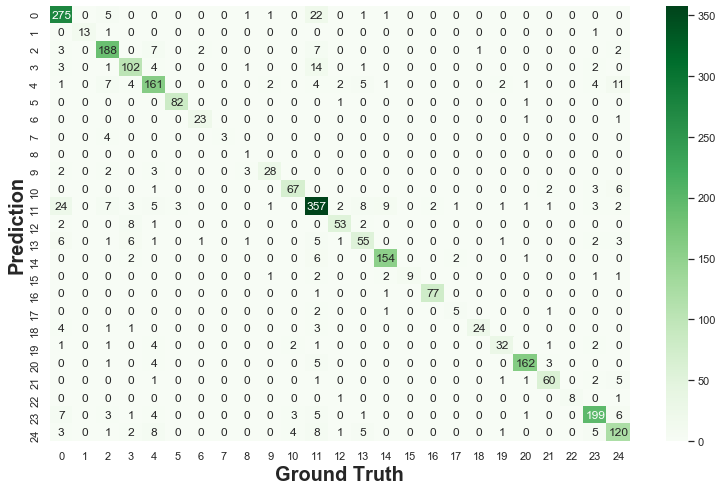

In [108]:
fig, ax = plt.subplots(figsize=(13,8))
conf = confusion_matrix(y_test, y_pred_cv)   #plot confusion matrix
sns.heatmap(conf, annot=True, fmt="d", cmap="Greens")
ax.set_ylabel("Prediction", fontweight="bold", fontsize=20)
ax.set_xlabel("Ground Truth", fontweight="bold", fontsize=20)